In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
from pathlib import Path
import sys
import os

# Add parent directory to path to import from main project
sys.path.append('..')

# Import from main VerveStacks project
from verve_stacks_processor import VerveStacksProcessor

# Configuration
input_iso = "USA"  # Change this to your target ISO
current_year = 2025

print(f"Preparing GEM dashboard data for ISO: {input_iso}")

def process_gem_for_dashboard(main_processor, input_iso):
    """
    Simplified GEM processing for dashboard - extracts only what we need:
    1. ISO filtering
    2. Status filtering  
    3. Start year validation
    4. model_fuel creation using gem_techmap
    
    Skips: technoeconomic data, gap-filling, spatial mapping, cost calculations
    """
    
    # Filter GEM data for the specific ISO
    df_gem_iso = main_processor.df_gem[main_processor.df_gem['iso_code'] == input_iso].copy()
    
    # Filter for active statuses (same logic as process_gem_data)
    statuses_to_keep = ['operating', 'construction', 'mothballed']
    df_gem_iso = df_gem_iso[df_gem_iso['Status'].isin(statuses_to_keep)]
    
    # Start year validation (same logic as process_gem_data)
    def is_valid_year(val):
        try:
            year = int(val)
            return 1900 <= year <= 2100
        except (ValueError, TypeError):
            return False

    def get_start_year(row):
        status = str(row['Status']).lower()
        year_val = row['Start year']
        if not is_valid_year(year_val):
            if status == 'construction':
                return 2028
            else:
                return 2015
        return int(year_val)

    df_gem_iso['Start year'] = df_gem_iso.apply(get_start_year, axis=1)
    
    # Create model_fuel using the gem_techmap (same logic as main pipeline)
    # First, create a simplified model_fuel based on Type and Fuel
    def create_model_fuel(row):
        """Create model_fuel field using VerveStacks logic"""
        if row['Type'] == 'hydropower':
            return 'hydro'
        elif row['Type'] == 'oil/gas':
            if pd.notna(row['Fuel']):
                fuel_val = str(row['Fuel']).lower()
                if 'fossil liquids:' in fuel_val or 'oil' in fuel_val:
                    return 'oil'
                else:
                    return 'gas'
            else:
                return 'gas'  # Default for oil/gas without fuel specification
        else:
            return row['Type']

    df_gem_iso['model_fuel'] = df_gem_iso.apply(create_model_fuel, axis=1)
    
    # Apply gem_techmap for proper model_fuel mapping (if available)
    try:
        gem_map = main_processor.df_gem_map
        if gem_map is not None and not gem_map.empty:
            # Create Technology field if missing (same as main pipeline)
            df_gem_iso['Technology'] = df_gem_iso.apply(
                lambda row: row['Type'] if pd.isna(row.get('Technology')) else row.get('Technology'), 
                axis=1
            )
            
            # Merge with gem_techmap to get proper model_fuel
            df_gem_iso = df_gem_iso.merge(
                gem_map[['model_fuel', 'Technology']].drop_duplicates(), 
                left_on='Technology', 
                right_on='Technology', 
                how='left',
                suffixes=('_original', '')
            )
            
            # Use mapped model_fuel where available, fallback to original
            df_gem_iso['model_fuel'] = df_gem_iso['model_fuel'].fillna(df_gem_iso.get('model_fuel_original', df_gem_iso['model_fuel']))
            
            # Clean up temporary columns
            if 'model_fuel_original' in df_gem_iso.columns:
                df_gem_iso = df_gem_iso.drop(columns=['model_fuel_original'])
                
    except Exception as e:
        print(f"Note: Using simplified model_fuel mapping (gem_techmap not available: {e})")
    
    return df_gem_iso

# Initialize VerveStacks processor to get processed GEM data
print("Loading VerveStacks processor...")
main_processor = VerveStacksProcessor(data_dir="../data", cache_dir="../cache")

print(f"Processing GEM data for {input_iso} (dashboard-optimized)...")
df_grouped_gem = process_gem_for_dashboard(main_processor, input_iso)

print(f"Found {len(df_grouped_gem)} processed plants for {input_iso}")
print("Available model_fuel types:")
print(df_grouped_gem['model_fuel'].value_counts())


2025-09-08 15:26:19,833 - INFO - Loading data from cache...


Preparing GEM dashboard data for ISO: USA
Loading VerveStacks processor...


2025-09-08 15:26:20,609 - INFO - Data loaded from cache.


Processing GEM data for USA (dashboard-optimized)...
Found 14827 processed plants for USA
Available model_fuel types:
model_fuel
solar         6947
gas           2622
oil           2616
wind          1547
coal           403
hydro          324
bioenergy      146
geothermal     126
nuclear         96
Name: count, dtype: int64


In [53]:
# 1. TOTAL GW BY MODEL_FUEL (Operating Plants Only)
print("\n" + "="*50)
print("1. TOTAL CAPACITY BY MODEL_FUEL")
print("="*50)

# Focus on operating plants for current capacity analysis
operating_plants = df_grouped_gem[df_grouped_gem['Status'] == 'operating'].copy()

# Aggregate by model_fuel
capacity_by_fuel = operating_plants.groupby('model_fuel').agg({
    'Capacity (MW)': ['sum', 'count', 'mean']
}).round(2)

# Flatten column names
capacity_by_fuel.columns = ['Total_MW', 'Unit_Count', 'Avg_Size_MW']
capacity_by_fuel['Total_GW'] = (capacity_by_fuel['Total_MW'] / 1000).round(2)
capacity_by_fuel = capacity_by_fuel.sort_values('Total_GW', ascending=False)

print(f"\nOperating Capacity by Fuel Type for {input_iso}:")
print(capacity_by_fuel)

# Prepare data for dashboard export
dashboard_capacity_data = {
    'iso': input_iso,
    'total_operating_gw': capacity_by_fuel['Total_GW'].sum(),
    'fuel_breakdown': capacity_by_fuel.to_dict('index'),
    'generation_date': pd.Timestamp.now().isoformat()
}

print(f"\nTotal Operating Capacity: {dashboard_capacity_data['total_operating_gw']} GW")



1. TOTAL CAPACITY BY MODEL_FUEL

Operating Capacity by Fuel Type for USA:
            Total_MW  Unit_Count  Avg_Size_MW  Total_GW
model_fuel                                             
gas         557169.8        2495       223.31    557.17
oil         554897.4        2489       222.94    554.90
coal        194683.3         403       483.09    194.68
wind        152379.1        1500       101.59    152.38
solar       121361.1        6500        18.67    121.36
nuclear     102954.0          96      1072.44    102.95
hydro        92358.0         324       285.06     92.36
bioenergy     7263.0         145        50.09      7.26
geothermal    3733.5         118        31.64      3.73

Total Operating Capacity: 1786.79 GW


In [54]:
# 2. IDENTIFY TOP 2 DOMINANT FUELS FOR THIS ISO
print("\n" + "="*50)
print("2. TOP 2 DOMINANT FUELS IDENTIFICATION")
print("="*50)

# Find top 2 fuels by operating capacity for this specific ISO
top_fuels = capacity_by_fuel.head(2)
dominant_fuels = top_fuels.index.tolist()

print(f"\nTop 2 dominant fuels for {input_iso}:")
for i, fuel in enumerate(dominant_fuels, 1):
    capacity = top_fuels.loc[fuel, 'Total_GW']
    units = int(top_fuels.loc[fuel, 'Unit_Count'])
    print(f"{i}. {fuel}: {capacity} GW ({units} units)")

# Store for dashboard
dashboard_dominant_fuels = {
    'iso': input_iso,
    'dominant_fuels': [
        {
            'rank': i+1,
            'fuel': fuel,
            'capacity_gw': float(top_fuels.loc[fuel, 'Total_GW']),
            'unit_count': int(top_fuels.loc[fuel, 'Unit_Count']),
            'avg_size_mw': float(top_fuels.loc[fuel, 'Avg_Size_MW'])
        }
        for i, fuel in enumerate(dominant_fuels)
    ]
}



2. TOP 2 DOMINANT FUELS IDENTIFICATION

Top 2 dominant fuels for USA:
1. gas: 557.17 GW (2495 units)
2. oil: 554.9 GW (2489 units)


In [55]:
# 3. AGE AND SIZE PROFILES FOR TOP 2 DOMINANT FUELS
print("\n" + "="*50)
print("3. AGE AND SIZE PROFILES (TOP 2 FUELS ONLY)")
print("="*50)

# Calculate plant age
operating_plants['Age'] = current_year - operating_plants['Start year'].fillna(2015)
operating_plants['Age'] = operating_plants['Age'].clip(0, 100)  # Reasonable age bounds

# Define bins for analysis
age_bins = [0, 5, 10, 20, 30, 50, 100]
age_labels = ['0-5yr', '5-10yr', '10-20yr', '20-30yr', '30-50yr', '50+yr']

size_bins = [0, 10, 50, 100, 500, 1000, 5000]
size_labels = ['<10MW', '10-50MW', '50-100MW', '100-500MW', '500-1000MW', '1000+MW']

dashboard_profiles = {
    'iso': input_iso,
    'dominant_fuels_profiles': {}
}

# Generate profiles for each dominant fuel
for fuel_type in dominant_fuels:
    print(f"\n--- {fuel_type.upper()} PROFILE ---")
    
    fuel_data = operating_plants[operating_plants['model_fuel'] == fuel_type].copy()
    
    if len(fuel_data) == 0:
        print(f"No operating plants found for {fuel_type}")
        continue
    
    # Age histogram
    fuel_data['Age_Bin'] = pd.cut(fuel_data['Age'], bins=age_bins, labels=age_labels, include_lowest=True)
    age_dist = fuel_data.groupby('Age_Bin', observed=True).agg({
        'Capacity (MW)': ['sum', 'count']
    }).round(1)
    age_dist.columns = ['Capacity_MW', 'Unit_Count']
    age_dist['Capacity_GW'] = (age_dist['Capacity_MW'] / 1000).round(2)
    
    # Size histogram  
    fuel_data['Size_Bin'] = pd.cut(fuel_data['Capacity (MW)'], bins=size_bins, labels=size_labels, include_lowest=True)
    size_dist = fuel_data.groupby('Size_Bin', observed=True).agg({
        'Capacity (MW)': ['sum', 'count']
    }).round(1)
    size_dist.columns = ['Capacity_MW', 'Unit_Count']
    size_dist['Capacity_GW'] = (size_dist['Capacity_MW'] / 1000).round(2)
    
    print(f"\nAge Distribution for {fuel_type}:")
    print(age_dist)
    
    print(f"\nSize Distribution for {fuel_type}:")
    print(size_dist)
    
    # Store for dashboard
    dashboard_profiles['dominant_fuels_profiles'][fuel_type] = {
        'age_distribution': age_dist.to_dict('index'),
        'size_distribution': size_dist.to_dict('index'),
        'total_units': len(fuel_data),
        'total_capacity_gw': fuel_data['Capacity (MW)'].sum() / 1000,
        'avg_age': fuel_data['Age'].mean(),
        'avg_size_mw': fuel_data['Capacity (MW)'].mean()
    }



3. AGE AND SIZE PROFILES (TOP 2 FUELS ONLY)

--- GAS PROFILE ---

Age Distribution for gas:
         Capacity_MW  Unit_Count  Capacity_GW
Age_Bin                                      
0-5yr        37225.4         140        37.23
5-10yr       68020.6         200        68.02
10-20yr     106268.8         442       106.27
20-30yr     234046.0        1040       234.05
30-50yr      57606.2         364        57.61
50+yr        54002.8         309        54.00

Size Distribution for gas:
            Capacity_MW  Unit_Count  Capacity_GW
Size_Bin                                        
10-50MW          4300.0          86         4.30
50-100MW        77896.3        1087        77.90
100-500MW      196095.9         945       196.10
500-1000MW     226680.6         336       226.68
1000+MW         52197.0          41        52.20

--- OIL PROFILE ---

Age Distribution for oil:
         Capacity_MW  Unit_Count  Capacity_GW
Age_Bin                                      
0-5yr        37175.4        

In [56]:
# 4. MAP DATA FOR OPERATING UNITS
print("\n" + "="*50)
print("4. GEOSPATIAL DATA FOR MAPPING")
print("="*50)

# Prepare map data with valid coordinates
map_data = operating_plants[
    (operating_plants['Latitude'].notna()) & 
    (operating_plants['Longitude'].notna()) &
    (operating_plants['Latitude'] != 0) &
    (operating_plants['Longitude'] != 0)
].copy()

print(f"Plants with valid coordinates: {len(map_data)} out of {len(operating_plants)} operating plants")

if len(map_data) > 0:
    # Add size categories for map visualization
    map_data['Size_Category'] = pd.cut(
        map_data['Capacity (MW)'], 
        bins=[0, 50, 200, 500, 1000, float('inf')],
        labels=['<50MW', '50-200MW', '200-500MW', '500-1000MW', '>1000MW']
    )
    
    # Prepare dashboard map data
    dashboard_map_data = {
        'iso': input_iso,
        'total_mapped_plants': len(map_data),
        'total_mapped_capacity_gw': map_data['Capacity (MW)'].sum() / 1000,
        'plants': []
    }
    
    # Convert to list of plant records for dashboard
    for _, plant in map_data.iterrows():
        plant_record = {
            'name': plant.get('Plant / Project name', 'Unknown'),
            'model_fuel': plant['model_fuel'],
            'capacity_mw': float(plant['Capacity (MW)']),
            'size_category': plant['Size_Category'],
            'status': plant['Status'],
            'start_year': int(plant['Start year']) if pd.notna(plant['Start year']) else None,
            'age': int(plant['Age']) if pd.notna(plant['Age']) else None,
            'latitude': float(plant['Latitude']),
            'longitude': float(plant['Longitude']),
            'city': plant.get('City', ''),
            'subnational_unit': plant.get('Subnational unit (state, province)', ''),
            'gem_location_id': plant.get('GEM location ID', '')
        }
        dashboard_map_data['plants'].append(plant_record)
    
    print(f"\nMap data summary:")
    print(f"- Total plants: {dashboard_map_data['total_mapped_plants']}")
    print(f"- Total capacity: {dashboard_map_data['total_mapped_capacity_gw']:.1f} GW")
    
    # Show distribution by fuel type
    map_fuel_dist = map_data.groupby('model_fuel')['Capacity (MW)'].agg(['count', 'sum']).round(1)
    map_fuel_dist.columns = ['Plant_Count', 'Capacity_MW']
    map_fuel_dist['Capacity_GW'] = (map_fuel_dist['Capacity_MW'] / 1000).round(2)
    print(f"\nFuel distribution in mapped plants:")
    print(map_fuel_dist)
    
else:
    print("Warning: No plants with valid coordinates found!")
    dashboard_map_data = {
        'iso': input_iso,
        'total_mapped_plants': 0,
        'total_mapped_capacity_gw': 0,
        'plants': []
    }



4. GEOSPATIAL DATA FOR MAPPING
Plants with valid coordinates: 14070 out of 14070 operating plants

Map data summary:
- Total plants: 14070
- Total capacity: 1786.8 GW

Fuel distribution in mapped plants:
            Plant_Count  Capacity_MW  Capacity_GW
model_fuel                                       
bioenergy           145       7263.0         7.26
coal                403     194683.3       194.68
gas                2495     557169.8       557.17
geothermal          118       3733.5         3.73
hydro               324      92358.0        92.36
nuclear              96     102954.0       102.95
oil                2489     554897.4       554.90
solar              6500     121361.1       121.36
wind               1500     152379.1       152.38


In [57]:
# 5. EXPORT DASHBOARD DATA
print("\n" + "="*50)
print("5. EXPORTING DASHBOARD DATA")
print("="*50)

# Create output directory
output_dir = Path("output")
output_dir.mkdir(exist_ok=True)

# Combine all dashboard data
dashboard_data = {
    'metadata': {
        'iso': input_iso,
        'generation_date': pd.Timestamp.now().isoformat(),
        'total_plants': len(df_grouped_gem),
        'operating_plants': len(operating_plants),
        'mapped_plants': len(map_data),
        'total_operating_capacity_gw': capacity_by_fuel['Total_GW'].sum(),
        'data_source': 'Global Energy Monitor (GEM) - Global Integrated Power Database'
    },
    
    'capacity_summary': {
        'by_fuel': capacity_by_fuel.to_dict('index'),
        'dominant_fuels': dominant_fuels
    },
    
    'fuel_profiles': dashboard_profiles['dominant_fuels_profiles'],
    
    'map_data': {
        'total_mapped_plants': len(map_data),
        'total_mapped_capacity_gw': map_data['Capacity (MW)'].sum() / 1000,
        'plants': dashboard_map_data['plants'][:1000]  # Limit to 1000 plants for performance
    }
}

# Export to JSON
json_file = output_dir / f"gem_dashboard_data_{input_iso}.json"
with open(json_file, 'w') as f:
    json.dump(dashboard_data, f, indent=2, default=str)

print(f"✅ Dashboard data exported to: {json_file}")
print(f"📊 Summary:")
print(f"   - ISO: {input_iso}")
print(f"   - Total Operating Capacity: {dashboard_data['metadata']['total_operating_capacity_gw']:.1f} GW")
print(f"   - Operating Plants: {dashboard_data['metadata']['operating_plants']:,}")
print(f"   - Mapped Plants: {dashboard_data['metadata']['mapped_plants']:,}")
print(f"   - Top 2 Fuels: {', '.join(dominant_fuels)}")

# Also export a simplified CSV for quick analysis
csv_file = output_dir / f"gem_capacity_summary_{input_iso}.csv"
capacity_by_fuel.to_csv(csv_file)
print(f"📋 Capacity summary CSV: {csv_file}")

print(f"\n🎯 Dashboard data preparation complete for {input_iso}!")
print(f"Files ready for dashboard integration:")
print(f"   - JSON Data: {json_file}")
print(f"   - CSV Summary: {csv_file}")
print(f"   - Histograms: output/gem_fuel_profiles_{input_iso}.png")
print(f"   - Interactive Map: output/gem_power_plants_map_{input_iso}.html")
print(f"\n📊 Summary Statistics:")
print(f"   - Total Operating Capacity: {dashboard_data['metadata']['total_operating_capacity_gw']:.1f} GW")
print(f"   - Operating Plants: {dashboard_data['metadata']['operating_plants']:,}")
print(f"   - Mapped Plants: {dashboard_data['metadata']['mapped_plants']:,}")
print(f"   - Top 2 Fuels: {', '.join(dominant_fuels)}")
print(f"   - Coverage: {(dashboard_data['metadata']['mapped_plants']/dashboard_data['metadata']['operating_plants']*100):.1f}% plants have coordinates")



5. EXPORTING DASHBOARD DATA
✅ Dashboard data exported to: output\gem_dashboard_data_USA.json
📊 Summary:
   - ISO: USA
   - Total Operating Capacity: 1786.8 GW
   - Operating Plants: 14,070
   - Mapped Plants: 14,070
   - Top 2 Fuels: gas, oil
📋 Capacity summary CSV: output\gem_capacity_summary_USA.csv

🎯 Dashboard data preparation complete for USA!
Files ready for dashboard integration:
   - JSON Data: output\gem_dashboard_data_USA.json
   - CSV Summary: output\gem_capacity_summary_USA.csv
   - Histograms: output/gem_fuel_profiles_USA.png
   - Interactive Map: output/gem_power_plants_map_USA.html

📊 Summary Statistics:
   - Total Operating Capacity: 1786.8 GW
   - Operating Plants: 14,070
   - Mapped Plants: 14,070
   - Top 2 Fuels: gas, oil
   - Coverage: 100.0% plants have coordinates



6. CREATING HISTOGRAMS FOR DOMINANT FUELS


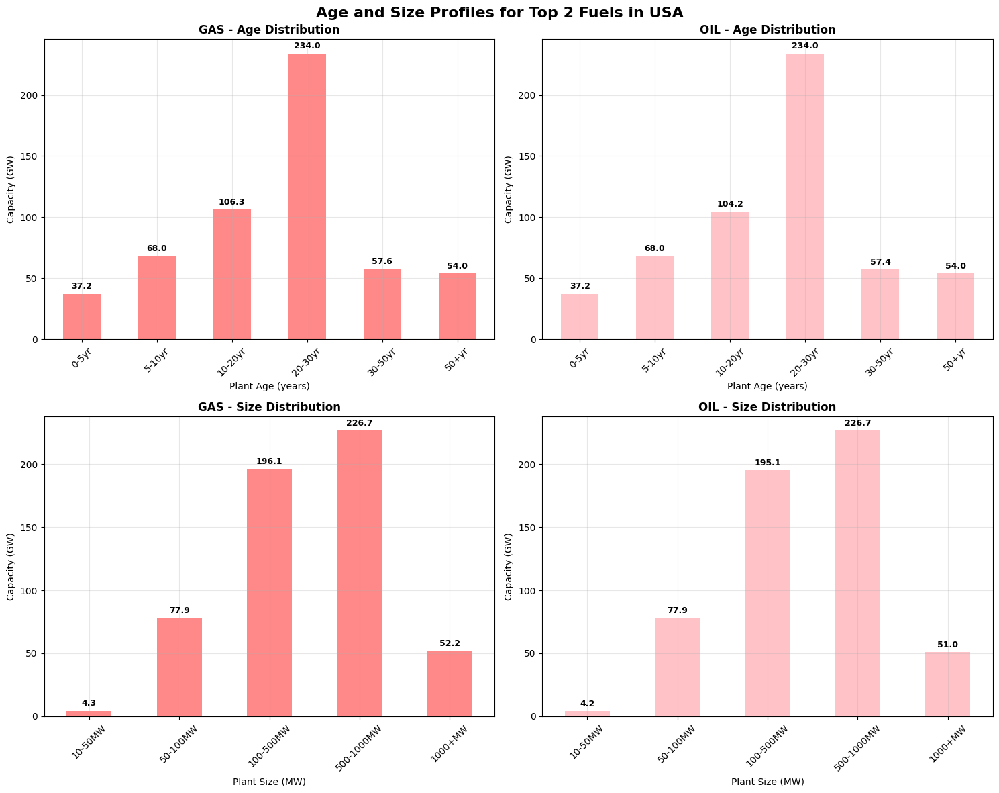

✅ Histograms saved to: output/gem_fuel_profiles_USA.png


In [58]:
# 6. VISUALIZATIONS - HISTOGRAMS FOR TOP 2 FUELS
print("\n" + "="*50)
print("6. CREATING HISTOGRAMS FOR DOMINANT FUELS")
print("="*50)

import matplotlib.pyplot as plt
import seaborn as sns

# Set up the plotting style
plt.style.use('default')
sns.set_palette("husl")

# Create figure with subplots for the two dominant fuels
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle(f'Age and Size Profiles for Top 2 Fuels in {input_iso}', fontsize=16, fontweight='bold')

# Define colors for each fuel
fuel_colors = {'gas': '#FF6B6B', 'coal': '#4ECDC4', 'solar': '#FFE66D', 'wind': '#95E1D3', 
               'hydro': '#A8E6CF', 'nuclear': '#DCEDC1', 'oil': '#FFB3BA', 'bioenergy': '#BFEFFF'}

for i, fuel_type in enumerate(dominant_fuels):
    fuel_data = operating_plants[operating_plants['model_fuel'] == fuel_type].copy()
    color = fuel_colors.get(fuel_type, '#95A5A6')
    
    # Age histogram (top row)
    ax_age = axes[0, i]
    fuel_data['Age_Bin'] = pd.cut(fuel_data['Age'], bins=age_bins, labels=age_labels, include_lowest=True)
    age_dist = fuel_data.groupby('Age_Bin', observed=True)['Capacity (MW)'].sum() / 1000  # Convert to GW
    
    age_dist.plot(kind='bar', ax=ax_age, color=color, alpha=0.8)
    ax_age.set_title(f'{fuel_type.upper()} - Age Distribution', fontweight='bold', fontsize=12)
    ax_age.set_xlabel('Plant Age (years)', fontsize=10)
    ax_age.set_ylabel('Capacity (GW)', fontsize=10)
    ax_age.tick_params(axis='x', rotation=45)
    ax_age.grid(True, alpha=0.3)
    
    # Add capacity values on bars
    for j, v in enumerate(age_dist.values):
        if v > 0:
            ax_age.text(j, v + max(age_dist.values) * 0.01, f'{v:.1f}', 
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # Size histogram (bottom row)
    ax_size = axes[1, i]
    fuel_data['Size_Bin'] = pd.cut(fuel_data['Capacity (MW)'], bins=size_bins, labels=size_labels, include_lowest=True)
    size_dist = fuel_data.groupby('Size_Bin', observed=True)['Capacity (MW)'].sum() / 1000  # Convert to GW
    
    size_dist.plot(kind='bar', ax=ax_size, color=color, alpha=0.8)
    ax_size.set_title(f'{fuel_type.upper()} - Size Distribution', fontweight='bold', fontsize=12)
    ax_size.set_xlabel('Plant Size (MW)', fontsize=10)
    ax_size.set_ylabel('Capacity (GW)', fontsize=10)
    ax_size.tick_params(axis='x', rotation=45)
    ax_size.grid(True, alpha=0.3)
    
    # Add capacity values on bars
    for j, v in enumerate(size_dist.values):
        if v > 0:
            ax_size.text(j, v + max(size_dist.values) * 0.01, f'{v:.1f}', 
                        ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(f'output/gem_fuel_profiles_{input_iso}.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ Histograms saved to: output/gem_fuel_profiles_{input_iso}.png")


In [59]:
# 7. INTERACTIVE MAP OF OPERATING UNITS
print("\n" + "="*50)
print("7. CREATING INTERACTIVE MAP")
print("="*50)

import folium
from folium import plugins
import random

# Create base map centered on the country
# Get approximate center coordinates for the ISO
country_centers = {
    'USA': [39.8283, -98.5795],
    'CHN': [35.8617, 104.1954],
    'IND': [20.5937, 78.9629],
    'DEU': [51.1657, 10.4515],
    'JPN': [36.2048, 138.2529],
    'GBR': [55.3781, -3.4360],
    'FRA': [46.2276, 2.2137],
    'BRA': [-14.2350, -51.9253],
    'CAN': [56.1304, -106.3468],
    'AUS': [-25.2744, 133.7751]
}

center_coords = country_centers.get(input_iso, [0, 0])
zoom_levels = {'USA': 4, 'CHN': 4, 'IND': 5, 'DEU': 6, 'JPN': 6}
zoom_level = zoom_levels.get(input_iso, 4)

# Create the map
m = folium.Map(
    location=center_coords,
    zoom_start=zoom_level,
    tiles='OpenStreetMap'
)

# Add a title
title_html = f'''
<h3 align="center" style="font-size:20px"><b>Power Plants in {input_iso}</b></h3>
<p align="center" style="font-size:14px">
Total Operating Capacity: {capacity_by_fuel['Total_GW'].sum():.1f} GW | 
Plants: {len(operating_plants):,} | 
Top Fuels: {', '.join(dominant_fuels)}
</p>
'''
m.get_root().html.add_child(folium.Element(title_html))

# Define colors and sizes for different fuel types and capacities
fuel_colors_map = {
    'gas': '#FF6B6B', 'coal': '#2C3E50', 'solar': '#F39C12', 'wind': '#27AE60',
    'hydro': '#3498DB', 'nuclear': '#9B59B6', 'oil': '#E74C3C', 
    'bioenergy': '#16A085', 'geothermal': '#E67E22'
}

# Function to get marker size based on capacity
def get_marker_size(capacity_mw):
    if capacity_mw < 50:
        return 3
    elif capacity_mw < 200:
        return 5
    elif capacity_mw < 500:
        return 8
    elif capacity_mw < 1000:
        return 12
    else:
        return 16

# Sample plants for performance (show max 2000 plants)
map_sample = map_data.sample(n=min(2000, len(map_data)), random_state=42).copy()

print(f"Adding {len(map_sample)} plants to interactive map...")

# Add plants to map
for idx, plant in map_sample.iterrows():
    # Get plant details
    fuel_type = plant['model_fuel']
    capacity = plant['Capacity (MW)']
    name = plant.get('Plant / Project name', 'Unknown Plant')
    city = plant.get('City', 'Unknown')
    state = plant.get('Subnational unit (state, province)', 'Unknown')
    start_year = plant.get('Start year', 'Unknown')
    age = plant.get('Age', 'Unknown')
    
    # Create popup content
    popup_content = f"""
    <div style="font-family: Arial, sans-serif; width: 250px;">
        <h4 style="margin: 0; color: #2C3E50;">{name}</h4>
        <hr style="margin: 5px 0;">
        <p style="margin: 2px 0;"><b>Fuel Type:</b> {fuel_type.title()}</p>
        <p style="margin: 2px 0;"><b>Capacity:</b> {capacity:.1f} MW</p>
        <p style="margin: 2px 0;"><b>Location:</b> {city}, {state}</p>
        <p style="margin: 2px 0;"><b>Start Year:</b> {start_year}</p>
        <p style="margin: 2px 0;"><b>Age:</b> {age} years</p>
        <p style="margin: 2px 0;"><b>Status:</b> {plant['Status'].title()}</p>
    </div>
    """
    
    # Add marker to map
    folium.CircleMarker(
        location=[plant['Latitude'], plant['Longitude']],
        radius=get_marker_size(capacity),
        popup=folium.Popup(popup_content, max_width=300),
        tooltip=f"{name} ({fuel_type.title()}, {capacity:.1f} MW)",
        color='white',
        weight=1,
        fillColor=fuel_colors_map.get(fuel_type, '#95A5A6'),
        fillOpacity=0.8
    ).add_to(m)

# Add legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height: 180px; 
            background-color: white; border:2px solid grey; z-index:9999; 
            font-size:14px; padding: 10px">
<h4 style="margin: 0 0 10px 0;">Legend</h4>
<p style="margin: 5px 0;"><b>Fuel Types:</b></p>
'''

for fuel, color in fuel_colors_map.items():
    if fuel in operating_plants['model_fuel'].values:
        legend_html += f'<p style="margin: 2px 0;"><span style="color:{color};">●</span> {fuel.title()}</p>'

legend_html += '''
<p style="margin: 5px 0;"><b>Size:</b></p>
<p style="margin: 2px 0;">● Small: <50 MW</p>
<p style="margin: 2px 0;">●● Medium: 50-500 MW</p>
<p style="margin: 2px 0;">●●● Large: >500 MW</p>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Add marker size clusters for better visualization
marker_cluster = plugins.MarkerCluster().add_to(m)

# Save the map
map_file = f'output/gem_power_plants_map_{input_iso}.html'
m.save(map_file)

print(f"✅ Interactive map created with {len(map_sample)} plants")
print(f"✅ Map saved to: {map_file}")
print(f"🗺️  Open the HTML file in your browser to view the interactive map!")

# Display the map (if in Jupyter)
try:
    from IPython.display import display
    display(m)
except ImportError:
    print("💡 To view the map, open the HTML file in your browser")

m



7. CREATING INTERACTIVE MAP
Adding 2000 plants to interactive map...
✅ Interactive map created with 2000 plants
✅ Map saved to: output/gem_power_plants_map_USA.html
🗺️  Open the HTML file in your browser to view the interactive map!
